# NN Compose - From MIDI to new Music

A traditional way to do creative AI for music generation is to read in a WAV file and learn about the time structure correlations between the sampled points. However, the samples are typically read in at 44100 Hz, which means that a 10 second audio clip has 441K points to learn about, and the time correlations can stretch back thousands or 10's of thousands of measurements. 

<img src="https://freesound.org/data/displays/242/242932_3719168_wave_L.png">

Let's imagine that a whole note happens as a bass note that the melody plays over **(guitar demo here)**. If that whole note is even 0.25s long before the melody starts, for the network to understand that timing correlation I'd need ~11K points in my RNN. That's a BEEFY RNN at best, that requires a long time to train and a machine better than mine. There are work-arounds that come from the underlying resonances, including Fourier Transforms, and applying convolutions... but those are computationally expensive as well.

This becomes unruly to work with on a small scale machine. For me, this was a side project I was working on while not connected to the internet, so I needed to find a better and more tractable way to work with the problem. 

**Enter MIDI.**

MIDI is a way of encoding musical information into something that a computer will understand that a human may not. Let's take a look at a traditional musical staff and how that relates to MIDI.

<img src="http://www.theoreticallycorrect.com/Helmholtz-Pitch-Numbering/Helmholtz-Pitch-Naming-And-Octave-Numbering-Grand-Staff.jpg">

In [15]:
with open('csv/Bach_Cantate_BWV20.csv','r') as f:
    CSV = f.read()
CSV = CSV.split('\n')
for line in CSV[62:80]:
    print(line)

2, 0, Note_on_c, 0, 62, 111
2, 0, Note_on_c, 0, 47, 111
2, 240, Note_off_c, 0, 47, 80
2, 240, Note_on_c, 0, 50, 111
2, 480, Note_off_c, 0, 62, 80
2, 480, Note_off_c, 0, 50, 80
2, 480, Note_on_c, 0, 59, 111
2, 480, Note_on_c, 0, 55, 111
2, 480, Note_on_c, 0, 50, 111
2, 960, Note_off_c, 0, 59, 80
2, 960, Note_off_c, 0, 55, 80
2, 960, Note_on_c, 0, 57, 111
2, 960, Note_off_c, 0, 50, 80
2, 960, Note_on_c, 0, 50, 111
2, 1200, Note_off_c, 0, 57, 80
2, 1200, Note_on_c, 0, 55, 111
2, 1440, Note_off_c, 0, 55, 80
2, 1440, Note_on_c, 0, 62, 111


So MIDI can encode all the notes and timing as long as we know how to dig into it. However, we have a small problem. Let's look at the contents of a MIDI file:

In [28]:
!cat midiIn/Bach_Cantate_BWV20.mid | head -10

MThd     �MTrk   R �Q
Cantate BWV20 �X
� �Q
�Z�`�X
Ł�x�Q*;x�Qq�x�Q��x�Q5  �/ MTrk  ( �Piste 1 �d  e   � @ �e  d @ &  e d �d  e   � @ �e  d @ &  e d �e  d @ e d �e  d @ e d � � �   �   �p �p �
@ �
@ �] �] �[ �[ �\  �\  �_  �_  p �p �>o /o�p�/P �2o�p�>P 2P �;o 7o 2o�`�;P 7P �9o �2P �2o�p�9P �7o�p�7P �>o 7o �2P �/o�`�>P 7P �>o �/P �-o�p�-P �+o�p�>P +P �@o 7o 0o�@�@P 7P 0P�`�@o 1o�`�@P 1P �9o 2o�`�9P 2P �9o 2o�`�9P 2P �>o /o�`�>P /P �<o *o�`�<P *P �;o 7o +o�`�;P 7P �9o �+P �2o�p�2P �0o�p�9P �7o �0P �/o�`�7P �>o�`�>P /P �7o 0o@o�L�7P @P �@o <o -o �0P �9o�p�9P �7o�p�@P <P -P �>o �7P �6o 2o�`�>P �<o�`�<P 6P 2P �+o7o;o��+P 7P ;P�`�9o 2o *o�`�9P 2P *P �+o2o;o�8�+P 2P ;P �=o 7o (o�`�=P 7P (P �>o *o�p9o�p�>P *P 9P �@o ;o +o�`�@P ;P +P �Bo >o -o�`�BP >P �@o =o�p�@P =P �>o�p�>P �>o 6o �-P �2o�`�>P 6P �;o �2P �*o�`�;P *P �>o 7o /o�p�/P �-o�p�>P 7P �>o �-P �/o�p�/P �0o�p�>P �Co ;o �0P �2o�`�CP ;P �Ao �2P �-o�p�-P �+o�p�AP +P �0o7o@o��0P 7P

It's encoded. Encoded in a way that we don't know how to unpack easily. That's a bitch to deal with. Let's leave that for later, and focus on the plan.

* Use a Recurrent Neural Net to learn about the note-to-note correlations. How far back do we want to look?
* Generate some sort of timing sequencing - could be randomized to start with. 
* Write some sort of generator where we feed it a seed and let it go to town generating new notes, and using that in a feedback loop.

# Let's look at the class for getting our data in order.

In [ ]:
# %load midifile.py
import subprocess
import os
import sys
import numpy as np
import pandas as pd
import random
import csv
import time
from operator import itemgetter

class midiFile(object):
    def __init__(self,fname):
        self.fname = fname
        self.oname = os.path.splitext(self.fname)[0] + "_NNCompose.mid"
        self.my_cols = ["instrument", "timing", "cmd","pitchshift","note","velocity","timeSig"]
        self.convertMidToCsv()
        self.df = self.convertCsvToDataframe()
        self.header = self.df[self.df['cmd'].str.contains("Header")]
        self.qn = int(self.header.iloc[0]['velocity'])
        self.tempo = int(self.df[self.df['cmd'].str.contains("Tempo")].iloc[0]['pitchshift'])
        self.command = self.df[self.df['instrument'] == 1]
        self.track2 = self.df[self.df['instrument'] == 2]
        self.startTrack = self.track2[self.track2['cmd'].str.contains("Start")]
        self.eof = self.df[self.df['cmd'].str.contains("End_of_file")]
        self.add_timing_info_to_df()
        self.df = self.df[self.df['cmd'].str.contains("Note_on")]
        self.df['note'] = self.df['note'].apply(np.int64)

    def add_timing_info_to_df(self):
        timing_df = self.df[self.df['cmd'].str.contains("Note_")]
        timing = timing_df.sort_values(by=['note','timing'])
        timing['length'] = timing.timing.diff()
        timing['beat'] = timing.length.shift(-1)
        beats = timing[timing['cmd'].str.contains("Note_on")]
        beats['note_length'] = beats.beat/self.qn*4
        beats['note_length'] = beats.note_length.astype(int)
        self.df = self.df.join(beats['note_length'])
        #self.df['note_length'] = self.df['note_length'].astype(int)
        
    def forceDataTypes(self,df):
        df['instrument'] = df['instrument'].astype(int)
        df['timing'] = df['timing'].astype(int)
        df['pitchshift'] = df['pitchshift'].astype(int)
        df['note'] = df['note'].astype(int)
        df['velocity'] = df['velocity'].astype(int)
        df['cmd'] = df['cmd'].astype(str)

    def convertMidToCsv(self):
        basename = os.path.splitext(self.fname)
        inp = "midiIn/" + str(basename[0]) + ".mid"
        if not os.path.isfile(inp):
            print("Did not find .mid file, trying .midi!")
            inp = "midiIn/" + str(basename[0]) + ".midi"
            if not os.path.isfile(inp):
                raise ValueError("No MIDI File Found")
        out = "csv/" + str(basename[0]) + ".csv"
        cmd = "midicsv " + inp + " >! " + out 
        csvCreated = subprocess.Popen(cmd, shell=True)
        print("Converting to CSV")
        time.sleep(5)

    def convertCsvToDataframe(self):
        basename = os.path.splitext(self.fname)
        inp = "csv/" + str(basename[0]) + ".csv"
        return pd.read_csv(inp, names=self.my_cols)

    def convertNotesToName(self):
        notename = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B']
        #self.df['noteName'] = self.df['note'].apply(lambda x: int(x % 12))
        self.df['noteName'] = self.df['note'] #if trying to include octaves)

    def convertMidiToMp3(self):
        basename = os.path.splitext(self.oname)
        inname = "midiOut/" + str(basename[0]) + ".mid"
        outname = "mp3Out/" + str(basename[0]) + ".mp3"
        cmd = "timidity -Ow -o - " + inname + "| lame - " + outname
        mp3Created = subprocess.Popen(cmd, shell=True)
        time.sleep(5)
        print("Created ", outname)
        
    def get_trainable_arrays(self, seq_length=10, col='note'):
        data = self.df[col].values
        x = []
        y = []
        for i in range(seq_length,len(data)):
            x.append(data[i-seq_length:i])
            y.append(data[i])
        print("X & Y Correlation:\n",x[0],y[0],"\nActual Data Correlation:\n",data[seq_length-2:seq_length+1])
        X = np.reshape(x, (len(x), seq_length, 1))
        Y = np.reshape(y, len(y))
        return X,Y
        
    def encode_target(self, y, n_values=128):
        ohe = []
        for val in y:
            el = np.zeros(n_values)
            el[int(val)-1] = 1
            ohe.append(el)
        return np.array(ohe)
    
    def convert_to_midi_format(self, result_notes):
        notes = []
        currentTime = 0

        for ind in result_notes:
            beatLength = 3
            while beatLength in [3,5,6,7]:
                beatLength = random.randint(1,4)
            dt = int(self.qn/beatLength)
            endtime = currentTime + dt
            
            for note in ind:
                notes.append([2,currentTime, "Note_on_c", 2, int(note), 95,False])
                notes.append([2,endtime, "Note_off_c", 2, int(note), 95, False])
            currentTime = endtime
        notes.append([2, currentTime, "End_track"])
        return sorted(notes,key=itemgetter(1))
    
    def check_valid_entry(self, item):
        if type(item) == str:
            return True
        elif not np.isnan(item):
            return True
        else:
            return False    

    def makeMidiOut(self,notes):
        basename = os.path.splitext(self.oname)
        filename = "csv/"+str(basename[0])+".csv"
        file_order = [self.header,self.command,self.startTrack,notes]
        with open(filename, 'w') as f:
            for section in file_order:
                if not type(section) == list:
                    try:
                        l = section.values.tolist()
                    except AttributeError:
                        l = section.tolist()
                else:
                    l = section
                for item in l:
                    outstr = ""
                    
                    if len(item) == 3:
                        if self.check_valid_entry(item[0]):
                            outstr = outstr + str(int(item[0])) + ", "
                        if self.check_valid_entry(item[1]):
                            outstr = outstr + str(int(item[1])) + ", " 
                        if self.check_valid_entry(item[2]):
                            outstr = outstr + str(item[2].lstrip(' ')) + ", "
                    else:
                        if self.check_valid_entry(item[0]):
                            outstr = outstr + str(int(item[0])) + ", "
                        if self.check_valid_entry(item[1]):
                            outstr = outstr + str(int(item[1])) + ", " 
                        if self.check_valid_entry(item[2]):
                            outstr = outstr + str(item[2].lstrip(' ')) + ", "
                        if self.check_valid_entry(item[3]):
                            if type(item[3]) == str:
                                outstr = outstr + str(item[3]) + ", "
                            else:
                                outstr = outstr + str(int(item[3])) + ", "
                        if self.check_valid_entry(item[4]):
                            outstr = outstr + str(int(item[4])) + ", "
                        if self.check_valid_entry(item[5]):
                            outstr = outstr + str(int(item[5])) + ", "
                        if self.check_valid_entry(item[6]):
                            outstr = outstr + str(int(item[6])) + ", "
                    outstr = outstr.rstrip(', ') + "\n"
                    f.write(outstr)
            item = self.eof.iloc[0].values
            if self.check_valid_entry(item[0]):
                outstr = outstr + str(int(item[0])) + ", "
            if self.check_valid_entry(item[1]):
                outstr = outstr + str(int(item[1])) + ", " 
            if self.check_valid_entry(item[2]):
                outstr = outstr + str(item[2].lstrip(' ')) + ", "
            outstr = outstr.rstrip(', ') + "\n"
            f.write(outstr)
        self.csv_to_midi()
    
    def csv_to_midi(self):
        basename = os.path.splitext(self.oname)
        filename = "csv/"+str(basename[0])+".csv"
        out = "midiOut/" + str(basename[0]) + ".mid"
        cmd = "csvmidi " + filename + " " + out 
        midCreated = subprocess.Popen(cmd, shell=True)
        print("Converting to MIDI")
        time.sleep(5)

Let's pull out a few key sections:

    def convertMidToCsv(self):
        basename = os.path.splitext(self.fname)
        inp = "midiIn/" + str(basename[0]) + ".mid"
        if not os.path.isfile(inp):
            print("Did not find .mid file, trying .midi!")
            inp = "midiIn/" + str(basename[0]) + ".midi"
            if not os.path.isfile(inp):
                raise ValueError("No MIDI File Found")
        out = "csv/" + str(basename[0]) + ".csv"
        cmd = "midicsv " + inp + " >! " + out 
        csvCreated = subprocess.Popen(cmd, shell=True)
        print("Converting to CSV")
        time.sleep(5)
        
    def convertCsvToDataframe(self):
        basename = os.path.splitext(self.fname)
        inp = "csv/" + str(basename[0]) + ".csv"
        return pd.read_csv(inp, names=self.my_cols)
    
    def __init__(self):
    
        # The ABOVE stuff then...
        
        self.header = self.df[self.df['cmd'].str.contains("Header")]
        self.qn = int(self.header.iloc[0]['velocity'])
        self.tempo = int(self.df[self.df['cmd'].str.contains("Tempo")].iloc[0]['pitchshift'])
        self.command = self.df[self.df['instrument'] == 1]
        self.track2 = self.df[self.df['instrument'] == 2]
        self.startTrack = self.track2[self.track2['cmd'].str.contains("Start")]
        self.eof = self.df[self.df['cmd'].str.contains("End_of_file")]
        self.add_timing_info_to_df()
        self.df = self.df[self.df['cmd'].str.contains("Note_on")]
        self.df['note'] = self.df['note'].apply(np.int64)
        

This is a bit ugly, but the keys here are that we're using a program called midicsv that decodes the binary MIDI file into a CSV file. Working with these sucks, because they can be very inconsistent... hence the ugly type/column/existence checking throughout the class. We then get the CSV wrangled and into a dataframe so that we can pull out the parts we're interested in, storing some of them to be used when we build a Midi file later with OUR music. 

The rest of the methods are for preparing our data for the network and writing the output to both CSV, MIDI, and MP3. Let's see this in action as well.

In [23]:
from midifile import *

mf = midiFile("Bach_Cantate_BWV20.mid")
mf.df

Converting to CSV


/Users/zachariahmiller/Documents/Projects/NNCompose/midifile.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  beats['note_length'] = beats.beat/self.qn*4
/Users/zachariahmiller/Documents/Projects/NNCompose/midifile.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  beats['note_length'] = beats.note_length.astype(int)


,instrument,timing,cmd,pitchshift,note,velocity,timeSig,note_length
62,2,0,Note_on_c,0,62,111.0,NaN,4.0
63,2,0,Note_on_c,0,47,111.0,NaN,2.0
65,2,240,Note_on_c,0,50,111.0,NaN,2.0
68,2,480,Note_on_c,0,59,111.0,NaN,4.0
69,2,480,Note_on_c,0,55,111.0,NaN,4.0
70,2,480,Note_on_c,0,50,111.0,NaN,4.0
73,2,960,Note_on_c,0,57,111.0,NaN,2.0
75,2,960,Note_on_c,0,50,111.0,NaN,4.0
77,2,1200,Note_on_c,0,55,111.0,NaN,2.0
79,2,1440,Note_on_c,0,62,111.0,NaN,4.0


For this system to work, I've turned the problem into a classification problem. All the targets are one-hot encoded (`encode_target()`) and we're always trying to find the most likely note to follow the previous sequences. The `get_trainable_arrays()` method sets up the data by breaking everything into X and y sections. The X will contain all the notes back to some lag distance, and the y contains the next note. We'll be exploiting the correlations between previous notes and the next note to make the decisions. This is why we're interested in RNN's, or more specifically, LSTMs.

# Setting up the network

I'm using Keras to build out an LSTM model. The model is designed to be adaptive to the data that I'm feeding in. If I send it something with 10 backnotes as X and the next note as Y, it will adopt that convention. The shaping of the data is done in the above class, as we'll see in the example. After that, I setup a a training routine for batch/epoch handling and feed in the data. It uses a checkpoint system to save the model weights as updates are completed, if the model is better than it was before (based on categorical cross-entropy loss).

The model is designed to be able to be spawned separately from each track and trained in an 'offline' manner. Meaning that I can send it a new song at any time and it will train to update it's understanding of the music. We'll exploit that design to train with multiple songs in a similar style so it begins to understand the style of music, not just one particular song.

We also have the beginning code for a "timing" network. It will work very similarly to the note network, but will use the lifetime of the notes as input instead of just the note itself. This should allow the network, in the future, to begin to understand the time structure of the song and not just rely on "quarter note" or "eighth note" randomization like the current version does.


In [ ]:
# %load neuralnet.py
# Create first network with Keras
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout, Activation, LSTM
from keras.utils import np_utils
from keras.wrappers.scikit_learn import KerasRegressor
from keras.callbacks import ModelCheckpoint
#sciKit for pipeline and CV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

class network(object):
    def __init__(self, X):
        self.model = self.getModel(X)

    def getModel(self,X):
        # create model
        model = Sequential()
        model.add(LSTM(400, input_shape=(X.shape[1],X.shape[2]), return_sequences=True))
        model.add(LSTM(200, input_shape=(X.shape[1],X.shape[2])))
        model.add(Dense(128,activation='softmax'))
        model.compile(loss='categorical_crossentropy', optimizer='adam')
        return model
    
    def train(self,x,y,epochs=20,batch_size=5,filepath="recent_lstm_model_weights.h5"):
        checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
        callbacks_list = [checkpoint]
        # fit the model
        self.model.fit(x, y, epochs=epochs, batch_size=batch_size, callbacks=callbacks_list)
        self.model = self.load_best_model(filepath)
        return self.model
        
    def load_best_model(self, filepath="recent_lstm_model_weights.h5"):
        return load_model(filepath)
    
class timing_network(object):
    def __init__(self, X):
        self.model = self.getModel(X)

    def getModel(self,X):
        # create model
        model = Sequential()
        model.add(LSTM(400, input_shape=(X.shape[1],X.shape[2]), return_sequences=True))
        model.add(LSTM(200, input_shape=(X.shape[1],X.shape[2])))
        model.add(Dense(16,activation='softmax'))
        model.compile(loss='categorical_crossentropy', optimizer='adam')
        return model
    
    def train(self,x,y,epochs=20,batch_size=5,filepath="recent_lstm_timing_model_weights.h5"):
        checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
        callbacks_list = [checkpoint]
        # fit the model
        self.model.fit(x, y, epochs=epochs, batch_size=batch_size, callbacks=callbacks_list)
        self.model = self.load_best_model(filepath)
        return self.model
        
    def load_best_model(self, filepath="recent_lstm_timing_model_weights.h5"):
        return load_model(filepath)

So what has this design been able to accomplish so far? Let's take a look at some results. Let's start by looking at a song that where the melody line was examined and the network was used to predict on the "train" data. We want to see if the network can start to learn that the keyboard position is allowed to fluctuate. The X axis here is the time position (basically, the 1st note is at 1, 2nd note at 2), ignoring the length of the notes. The y-axis is the position along the keyboard (lower number = bassier).

<img src="images/song_map_demo.png">

The network is tracking along pretty well! It is understanding that the previous notes are driving the next note and the notes don't have to be stagnant. This is just from a quick training to see whether it was learning and we can see that it's not yet understanding that fluctuations from the root note are expected. It's just capturing trend. We'll need to get a bit deeper. We also need to check some assumptions. Let's take an extended look at this track:

<img src="images/song_map_demo2.png">

This song (ForestMaze.mid) is actually made up of multiple instruments. We see a wild swing in shape of the track starting around note 160. The first section is actually just the background chording, the section around 160 is where the melody part comes in. It's much busier. This causes a problem... we're accidentally teaching our model about multiple behaviors. We need to really focus on one track at a time. Hence why the version below is using solo-guitar pieces as input.

We also see that in this version of the model, rests were not allowed for. Every note has position on the "song location" axis. To allow for rests, we need to build in a thresholding for "none of these notes seems likely." We also want to allow multiple notes to come through at once to allow for bass/melody overlaps from a single instrument. To allow for this, any notes above the threshold are allowed in and the threshold is set pretty conservatively low. 

# Making an output

To make the output, I rely on midicsv's reversing mode. If I feed it a csv that it understands, I can then convert that back to MIDI. Then using a combination of `timidity` and `lame` I can convert the MIDI to WAV and MP3. Those are a separate topic I won't get into. Let's talk about getting the CSV ready.

The CSV expects a header, a footer, and then all the commands for each track sandwiched in between. Since we only have one track at the moment, that means we need to keep track of the header and footer. The simplest thing to do is get the header and footer from the seed track, keep them in memory and put them into the output as the basis for the output track. Then we just need to add the note_on and note_off lines. Let's take a look. First we place the headers, then the MIDI commands for the whole track, then the notice to start the track, then the actual notes. For the actual notes section, we have a bunch of possible command lengths... the if statements handle those and get each line to look as midicsv expects. Finally, the EOF section is added to properly close the MIDI file.

    def makeMidiOut(self,notes):
            basename = os.path.splitext(self.oname)
            filename = "csv/"+str(basename[0])+".csv"
            file_order = [self.header,self.command,self.startTrack,notes]
            with open(filename, 'w') as f:
                for section in file_order:
                    if not type(section) == list:
                        try:
                            l = section.values.tolist()
                        except AttributeError:
                            l = section.tolist()
                    else:
                        l = section
                    for item in l:
                        outstr = ""

                        if len(item) == 3:
                            if self.check_valid_entry(item[0]):
                                outstr = outstr + str(int(item[0])) + ", "
                            if self.check_valid_entry(item[1]):
                                outstr = outstr + str(int(item[1])) + ", " 
                            if self.check_valid_entry(item[2]):
                                outstr = outstr + str(item[2].lstrip(' ')) + ", "
                        else:
                            if self.check_valid_entry(item[0]):
                                outstr = outstr + str(int(item[0])) + ", "
                            if self.check_valid_entry(item[1]):
                                outstr = outstr + str(int(item[1])) + ", " 
                            if self.check_valid_entry(item[2]):
                                outstr = outstr + str(item[2].lstrip(' ')) + ", "
                            if self.check_valid_entry(item[3]):
                                if type(item[3]) == str:
                                    outstr = outstr + str(item[3]) + ", "
                                else:
                                    outstr = outstr + str(int(item[3])) + ", "
                            if self.check_valid_entry(item[4]):
                                outstr = outstr + str(int(item[4])) + ", "
                            if self.check_valid_entry(item[5]):
                                outstr = outstr + str(int(item[5])) + ", "
                            if self.check_valid_entry(item[6]):
                                outstr = outstr + str(int(item[6])) + ", "
                        outstr = outstr.rstrip(', ') + "\n"
                        f.write(outstr)
                item = self.eof.iloc[0].values
                if self.check_valid_entry(item[0]):
                    outstr = outstr + str(int(item[0])) + ", "
                if self.check_valid_entry(item[1]):
                    outstr = outstr + str(int(item[1])) + ", " 
                if self.check_valid_entry(item[2]):
                    outstr = outstr + str(item[2].lstrip(' ')) + ", "
                outstr = outstr.rstrip(', ') + "\n"
                f.write(outstr)
            self.csv_to_midi()

We use subprocesses spawned by Python to run some BASH commands in the background which does all the conversion between MIDI, WAV, and MP3. This is because the conversions can take a while and need to run asynchronously from whatever Python is doing. By spawning them on their own threads, we give them the ability to just take care of business without messing with Python's thought process.

    def csv_to_midi(self):
        basename = os.path.splitext(self.oname)
        filename = "csv/"+str(basename[0])+".csv"
        out = "midiOut/" + str(basename[0]) + ".mid"
        cmd = "csvmidi " + filename + " " + out 
        midCreated = subprocess.Popen(cmd, shell=True)
        print("Converting to MIDI")
        time.sleep(5)

    def convertMidiToMp3(self):
        basename = os.path.splitext(self.oname)
        inname = "midiOut/" + str(basename[0]) + ".mid"
        outname = "mp3Out/" + str(basename[0]) + ".mp3"
        cmd = "timidity -Ow -o - " + inname + "| lame - " + outname
        mp3Created = subprocess.Popen(cmd, shell=True)
        time.sleep(5)
        print("Created ", outname)

# Let's actually run it!

In [1]:
import os
from midifile import *
from neuralnet import *
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use("seaborn-poster")

fileNames = [fileName for fileName in os.listdir("midiIn") if 'Bach' in str(fileName)]
fileNames

Using TensorFlow backend.


['Bach_Cantate_BWV20.mid',
 'Bach_Cantate_BWV33.mid',
 'Bach_Cantate_BWV8.midi',
 'Bach_Christ_Lay_Bonds_Death_BWV4.mid',
 'Bach_How_Brightly_Shines_Morning_Star_BWV1.mid',
 'Bach_My_Heart_Ever_Faithful_BWV34.mid']

In [ ]:
####### For Training across all songs in the fileNames list
#######

# sl = 20
# X = np.empty(shape=(10, sl, 1)) # shape[0] doesn't matter to the model
# model = network(X)
# data_seeds = []
# for track in fileNames:
#     mf = midiFile(track)
#     X,Y = mf.get_trainable_arrays(seq_length=sl)
#     data_seed = X[0]
#     data_seed = np.reshape(data_seed, (1, sl, 1))
#     data_seeds.append(data_seed)
#     target = mf.encode_target(Y)
#     model.train(X,target,epochs=100,batch_size=5,filepath="junk.h5")

### Load model and track, setup data

In [2]:
sl = 20
X = np.empty(shape=(10, sl, 1)) # shape[0] doesn't matter to the model
model = network(X).load_best_model()

mf = midiFile(fileNames[-1])
X,Y = mf.get_trainable_arrays(seq_length=sl)
data_seed = X[0]
data_seed = np.reshape(data_seed, (1, sl, 1))
target = mf.encode_target(Y)

Converting to CSV
X & Y Correlation:
 [60 57 46 57 53 58 55 60 57 45 65 57 53 64 58 52 62 57 50 60] 58 
Actual Data Correlation:
 [50 60 58]


## Use current song to generate a new result

In [3]:
train_results = model.model.predict(X)
tr_results = []
for val in train_results:
    tr_results.append(np.argmax(val))

In [4]:
preds = model.model.predict(X)
tr_results = []
plot_results = []
for p in preds:
    tr_results.append([list(np.where(p==x)[0])[0] for x in p if x > 0.2])
    plot_results.append(np.argmax(p))

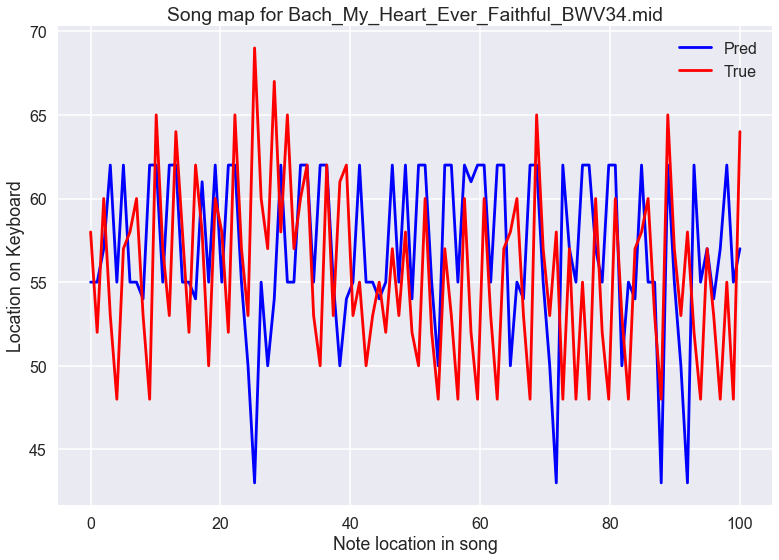

In [5]:
lowx = 0
highx = 100
plt.plot(np.linspace(0,len(plot_results[lowx:highx]),len(plot_results[lowx:highx])),plot_results[lowx:highx],'b',label="Pred")
plt.plot(np.linspace(0,len(Y[lowx:highx]),len(Y[lowx:highx])),Y[lowx:highx],'r',label="True");
plt.xlabel("Note location in song")
plt.ylabel("Location on Keyboard")
plt.title("Song map for %s"%mf.fname)
plt.legend()

We can see that given the training data, it's starting learn the structure. I accidentally deleted the images I wanted while making the L&L and had to do a really quick retraining. You can see a more mature result here:

<img src="images/song_map_bach.png">

In [ ]:
notes = mf.convert_to_midi_format(tr_results)
mf.makeMidiOut(notes)

In [ ]:
mf.convertMidiToMp3()

## Generate new song from seed

In [6]:
pl_results = []
results = []
for i in range(2000):
    if i%500==0:
        print("Generating point ",i)
    data_seed = np.reshape(data_seed, (1, sl, 1))
    next_val = model.model.predict(data_seed)
    results.append([list(np.where(next_val[0]==x)[0])[0] for x in next_val[0] if x > 0.2])
    next_val = np.argmax(next_val)
    pl_results.append(next_val)
    next_val = np.reshape(next_val,(1))
    data_seed = data_seed[0].tolist()
    data_seed.append([next_val])
    data_seed = data_seed[1:len(data_seed)]

Generating point  0
Generating point  500
Generating point  1000
Generating point  1500


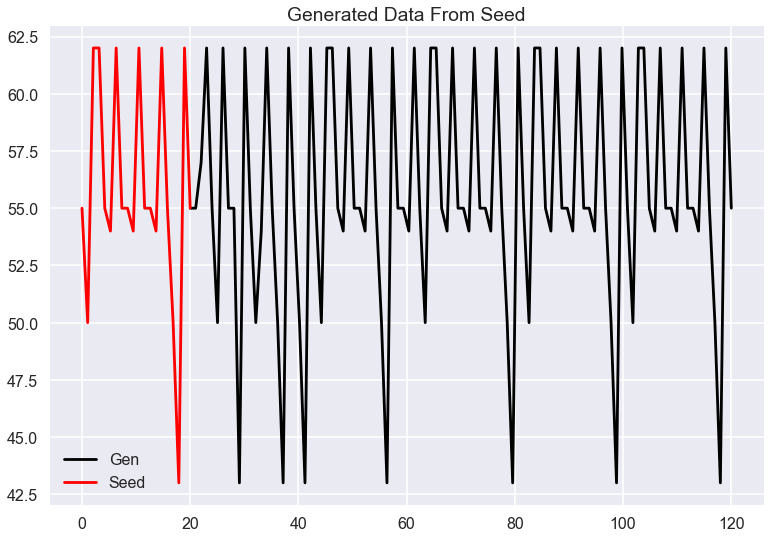

In [7]:
lowx = 0
highx = 100
data = data_seed
plt.plot(np.linspace(0,len(pl_results[lowx:highx]),len(pl_results[lowx:highx]))+sl,pl_results[lowx:highx],'k',label="Gen")
plt.plot(np.linspace(0,len(data[0:sl]),len(data[0:sl])),data[0:sl],'r',label="Seed");
plt.title("Generated Data From Seed")
plt.legend()

This is a VERY quick train because I accidentally deleted the longer training image while preparing the L&L, you can see that it's already caught in a pattern. This needs more time with more tracks to learn more, but we can see that we're able to generate from a seed without the solution blowing up.

In [ ]:
notes = mf.convert_to_midi_format(results)
mf.makeMidiOut(notes)

In [ ]:
mf.convertMidiToMp3()

# Let's hear some results (Note, this is 15 minutes long. Please don't listen to all of it. I generated a lot to see if it got stuck in a minimum anywhere)

So using the above code and training for about 30 minutes on a set of 6 Bach Cantate's for solo guitar, I generated a bunch of 'music.' There's definitely some interesting structure to it and some VERY out of tune notes along the way. It also doesn't get too stagnant in terms of just choosing the same loops over and over. I'm quite pleased that it:

* Learned that these pieces have rests throughout
* It learned how to stay (mostly) in-key
* It learned that bass notes tend to be accompanied by melody notes

However, the timing is randomized to use half, quarter, and eighth notes based on the tempo of the song uses as a seed. The timing network was not functional at the time of training - that's the next step which I've already begun to implement by keeping a separate "timing" data frame when processing the MIDI files.

In [1]:
import IPython
IPython.display.Audio("http://zwmiller.com/projects/Bach_Cantate_BWV20_NNCompose.mp3")